<a href="https://colab.research.google.com/github/jeffblackadar/CRANE-CCAD-maps/blob/main/text_on_map_tiles_transcription_azure_kennedy.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

This notebook uses Azure Cognitive Services to transcribe text on an old map.
It then puts the text with its geographic location into a shapefile.
A blog post about it is here: http://jeffblackadar.ca/

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# https://towardsdatascience.com/mapping-with-matplotlib-pandas-geopandas-and-basemap-in-python-d11b57ab5dac
# https://stackoverflow.com/questions/54613992/how-to-install-and-use-basemap-on-google-colab
# !apt-get install libgeos-3.6.2 (I am not sure if this is needed)
!apt-get install libgeos-dev
!pip install https://github.com/matplotlib/basemap/archive/master.zip
!pip install geopandas
!pip install contextily
!pip install -U rasterio

Reading package lists... Done
Building dependency tree       
Reading state information... Done
libgeos-dev is already the newest version (3.6.2-1build2).
libgeos-dev set to manually installed.
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 34 not upgraded.
     / 152.0MB 2.3MB/s
     |████████████████████████████████| 6.5MB 8.5MB/s 
     |████████████████████████████████| 225kB 46.1MB/s 
  Created wheel for basemap: filename=basemap-1.2.2+dev-cp37-cp37m-linux_x86_64.whl size=121759561 sha256=f4f3fa782532d0f1aed40ff11956f7ca75319483ac975ab77bb218480a4956e0
  Stored in directory: /tmp/pip-ephem-wheel-cache-wxp6pr2q/wheels/98/4a/fc/ce719b75d97e646645c225f3332b1b217536100314922e9572
  Created wheel for pyshp: filename=pyshp-2.1.3-cp37-none-any.whl size=37264 sha256=aca2528d141ee70c4c75ca44d983888bbd16dd221208a4c6445a8a76516c562e
  Stored in directory: /roo

     |████████████████████████████████| 1.0MB 8.8MB/s 
     |████████████████████████████████| 15.3MB 550kB/s 
     |████████████████████████████████| 19.1MB 1.2MB/s 
Requirement already up-to-date: rasterio in /usr/local/lib/python3.7/dist-packages (1.2.3)


In [6]:
!pip install --upgrade azure-cognitiveservices-vision-computervision

Requirement already up-to-date: azure-cognitiveservices-vision-computervision in /usr/local/lib/python3.7/dist-packages (0.8.0)


In [12]:
settings_path = "/content/drive/MyDrive/william_white/"
map_base_dir = '/content/drive/MyDrive/crane_kennedy_1856/'
    
import os
import json
# Set the file we wan!pip install --upgrade azure-cognitiveservices-vision-computervisiont to use for authenticating an Azure app
# The json file stores the COMPUTER_VISION_SUBSCRIPTION_KEY and COMPUTER_VISION_ENDPOINT so we don't have it in the code.
# The json file looks like this:
# {
# "COMPUTER_VISION_SUBSCRIPTION_KEY":"___the_COMPUTER_VISION_SUBSCRIPTION_KEY___",
# "COMPUTER_VISION_ENDPOINT":"___the_COMPUTER_VISION_ENDPOINT___"
# }
# cv.json contains the credentials for this program.
cv_settings_file = settings_path+'cv.json'
with open(cv_settings_file, "r") as read_file:
    cv_auth_data = json.load(read_file)

os.environ['COMPUTER_VISION_SUBSCRIPTION_KEY']=cv_auth_data["COMPUTER_VISION_SUBSCRIPTION_KEY"]
os.environ['COMPUTER_VISION_ENDPOINT']=cv_auth_data["COMPUTER_VISION_ENDPOINT"]

In [8]:
# https://docs.microsoft.com/en-us/azure/cognitive-services/computer-vision/quickstarts-sdk/python-sdk
from azure.cognitiveservices.vision.computervision import ComputerVisionClient
from azure.cognitiveservices.vision.computervision.models import OperationStatusCodes
from azure.cognitiveservices.vision.computervision.models import VisualFeatureTypes
from msrest.authentication import CognitiveServicesCredentials
from msrest.authentication import CognitiveServicesCredentials

from array import array
import os
from PIL import Image
import sys
import time
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
import geopandas as gpd
import pandas as pd
import contextily as ctx

In [9]:
# Add your Computer Vision subscription key to your environment variables.
if 'COMPUTER_VISION_SUBSCRIPTION_KEY' in os.environ:
    subscription_key = os.environ['COMPUTER_VISION_SUBSCRIPTION_KEY']
else:
    print("\nSet the COMPUTER_VISION_SUBSCRIPTION_KEY environment variable.\n**Restart your shell or IDE for changes to take effect.**")
    sys.exit()
# Add your Computer Vision endpoint to your environment variables.
if 'COMPUTER_VISION_ENDPOINT' in os.environ:
    endpoint = os.environ['COMPUTER_VISION_ENDPOINT']
else:
    print("\nSet the COMPUTER_VISION_ENDPOINT environment variable.\n**Restart your shell or IDE for changes to take effect.**")
    sys.exit()

In [10]:
computervision_client = ComputerVisionClient(endpoint, CognitiveServicesCredentials(subscription_key))

# Set this up for a series of images

In [6]:
import math
def recognize_text_in_local_image(local_image_handwritten_path):
    local_image_handwritten = open(local_image_handwritten_path, "rb")
    # Call API with image and raw response (allows you to get the operation location)
    recognize_handwriting_results = computervision_client.read_in_stream(local_image_handwritten, raw=True, language='fr')

    # Get the operation location (URL with an ID at the end) from the response
    operation_location_remote = recognize_handwriting_results.headers["Operation-Location"]
    # Grab the ID from the URL
    operation_id = operation_location_remote.split("/")[-1]

    # Call the "GET" API and wait for it to retrieve the results 
    while True:
        get_handw_text_results = computervision_client.get_read_result(operation_id)
        if get_handw_text_results.status not in ['notStarted', 'running']:
            break
        time.sleep(1)

    # Print the detected text, line by line
    lines_of_text = []
    if get_handw_text_results.status == OperationStatusCodes.succeeded:
        for text_result in get_handw_text_results.analyze_result.read_results:
            for line in text_result.lines:
                line_data = []  
                #print(line.text)
                line_data.append(line.text)
                #print(line.bounding_box)
                line_data.append(line.bounding_box)
                pts = line_data[1]
                xd = abs(pts[4] - pts[0])
                yd = abs(pts[5] - pts[1])
                word_length = math.sqrt((xd ** 2) + (yd ** 2))
            
                letter_length = round(word_length/len(line.text))
                print(line.text +"  "+str(letter_length))
                line_data.append(letter_length)
                lines_of_text.append(line_data)
    return(lines_of_text)          


In [7]:
import cv2
import matplotlib.pyplot as plt
import gdal
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point, Polygon

font                   = cv2.FONT_HERSHEY_SIMPLEX
bottomLeftCornerOfText = (10,500)
fontScale              = 1
fontColor              = (0,0,200)
fontColor_small        = (200,0,0)
lineType               = 2

def get_point_from_pixel(x,y, xoffset, px_w, rot1, yoffset, px_h, rot2):
    # supposing x and y are your pixel coordinate this 
    # is how to get the coordinate in space.
    posX = px_w * x + rot1 * y + xoffset
    posY = rot2 * x + px_h * y + yoffset

    posX = (px_w * x) + (rot1 * y) + xoffset
    posY = (px_h * y) + (rot2 * x) + yoffset
    # shift to the center of the pixel
    posX += px_w / 2.0
    posY += px_h / 2.0
    return(posX,posY)

def geocode_labels(local_image_handwritten_path, lines_of_text):
    img = cv2.imread(local_image_handwritten_path)
    img_ds = gdal.Open(local_image_handwritten_path)
    xoffset, px_w, rot1, yoffset, rot2, px_h  = img_ds.GetGeoTransform()

    line_text_poly = gpd.GeoDataFrame()
    line_text_poly['geometry'] = None
    #geotif_crs = 32128
    #geotif_crs = 32637 DAMAS
    geotif_crs = 32129 #PA South
    #geotif_crs = 4326
    line_text_poly.crs = ("EPSG:" + str(geotif_crs))
    line_text_poly.geometry = line_text_poly.geometry.to_crs(crs=geotif_crs)
    line_text_poly.to_crs(crs=geotif_crs)
    line_text_poly = line_text_poly.to_crs(epsg=geotif_crs)
   
    ln = 0
    for l in lines_of_text:
        pts = l[1]
        letter_size = l[2]
        fColor = fontColor
        if(letter_size < 90):
  
            p=[]
            for cn in range(0,4):
                p.append(get_point_from_pixel(pts[0+(cn*2)],pts[1+(cn*2)], xoffset, px_w, rot1, yoffset, px_h, rot2))
            coords = [(p[0][0], p[0][1]), (p[1][0], p[1][1]), (p[2][0], p[2][1]), (p[3][0], p[3][1])]
    
            poly = Polygon(coords)
            new_tp_row = {'id':ln, 'geometry':poly,'text':l[0]}
            line_text_poly = line_text_poly.append(new_tp_row, ignore_index=True)
    
    return(line_text_poly)

In [8]:

        tiles = []

        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r01c09.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r01c10.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r01c11.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r01c12.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r01c13.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r01c14.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r02c09.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r02c10.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r02c11.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r02c12.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r02c13.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r02c14.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r03c08.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r03c09.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r03c10.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r03c11.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r03c12.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r03c13.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r03c14.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r03c15.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r04c08.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r04c09.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r04c10.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r04c11.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r04c12.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r04c13.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r04c14.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r04c15.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r05c06.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r05c07.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r05c08.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r05c09.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r05c10.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r05c11.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r05c12.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r05c13.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r05c14.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r05c15.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r05c16.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r06c06.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r06c07.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r06c08.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r06c09.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r06c10.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r06c11.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r06c12.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r06c13.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r06c14.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r06c15.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r06c16.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r06c17.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r07c06.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r07c07.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r07c08.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r07c09.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r07c10.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r07c11.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r07c12.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r07c13.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r07c14.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r07c15.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r07c16.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r07c17.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r07c18.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r08c06.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r08c07.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r08c08.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r08c09.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r08c10.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r08c11.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r08c12.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r08c13.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r08c14.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r08c15.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r08c16.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r08c17.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r08c18.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r09c05.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r09c06.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r09c07.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r09c08.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r09c09.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r09c10.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r09c11.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r09c12.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r09c13.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r09c14.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r09c15.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r09c16.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r09c17.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r09c18.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r10c05.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r10c06.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r10c07.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r10c08.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r10c09.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r10c10.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r10c11.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r10c12.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r10c13.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r10c14.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r10c15.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r10c16.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r10c17.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r10c18.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r11c04.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r11c05.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r11c06.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r11c07.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r11c08.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r11c09.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r11c10.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r11c11.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r11c12.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r11c13.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r11c14.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r11c15.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r11c16.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r11c17.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r12c04.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r12c05.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r12c06.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r12c07.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r12c08.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r12c09.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r12c10.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r12c11.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r12c12.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r12c13.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r12c14.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r12c15.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r12c16.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r13c04.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r13c05.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r13c06.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r13c07.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r13c08.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r13c09.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r13c10.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r13c11.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r13c12.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r13c13.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r13c14.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r13c15.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r14c04.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r14c05.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r14c06.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r14c07.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r14c08.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r14c09.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r14c10.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r14c11.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r14c12.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r14c13.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r14c14.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r15c04.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r15c05.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r15c06.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r15c07.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r15c08.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r15c09.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r15c10.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r15c11.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r15c12.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r15c13.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r15c14.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r16c04.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r16c05.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r16c06.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r16c07.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r16c08.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r16c09.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r16c10.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r16c11.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r16c12.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r16c13.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r17c04.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r17c05.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r17c06.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r17c07.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r17c08.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r17c09.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r17c10.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r17c11.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r17c12.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r17c13.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r18c04.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r18c05.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r18c06.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r18c07.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r18c08.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r18c09.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r18c10.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r18c11.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r18c12.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r18c13.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r19c03.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r19c04.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r19c05.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r19c06.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r19c07.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r19c08.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r19c09.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r19c10.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r19c11.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r19c12.tif')
        tiles.append('/content/drive/MyDrive/crane_kennedy_1856/tif_tiles/r19c13.tif')
all_line_text_poly = gpd.GeoDataFrame()
all_line_text_poly['geometry'] = None
geotif_crs = 32129 #PA South
#geotif_crs = 4326
all_line_text_poly.crs = ("EPSG:" + str(geotif_crs))
all_line_text_poly.geometry = all_line_text_poly.geometry.to_crs(crs=geotif_crs)
all_line_text_poly.to_crs(crs=geotif_crs)
all_line_text_poly = all_line_text_poly.to_crs(epsg=geotif_crs)

for t in tiles:
    lines_of_text = recognize_text_in_local_image(t)
    temp_df = geocode_labels(t,lines_of_text)
    all_line_text_poly = gpd.GeoDataFrame(pd.concat([all_line_text_poly,temp_df], ignore_index=True), crs=all_line_text_poly.crs)

all_line_text_poly.to_file(os.path.join("/content/drive/MyDrive/crane_kennedy_1856/","all_line_text.shp"))

15'  20
Unionville 35  16
Smithy  19
MENME. Ch.  18
2 0'  18
Manatawny Ford  19
Laurel Hill Locks  15
RIVER  20
Unionville  17
SCHUYLKILL  18
Pottstowny Landing  17
Prices G.M.  19
Smithy  19
Neimans Store  18
Clover. M.  14
S.H.  20
Stumptown  20
ENME. Ch.  18
Smithy  19
Longitude  20
Manatawny Ford  19
VER  20
POTTSTOWN  24
Girard Canal  21
Pottstowny Landing  17
Parkers Ford  17
G.M.  19
Geists Ford  15
M.  26
Lumber Yard  17
S.H.  19
Stumptown  20
Stagers  15
Jones Rimi  15
Ford  19
Bom  23
Hook  18
Longitude East 1º 24' 57" from Washington.  17
ers Ford  15
Geists Ford  15
Fricks Lo  16
Hiesters Ford  15
Stagers  16
Ford  18
Bombay  23
Hook Rock  17
moton.  20
13  15
ord  19
Hopewell Furnace  17
Bethesda  18
Bap. Ch.  17
MME. Ch.  19
Sher  18
N  93
CHESNUT HI  35
Bethesda  19
Bap Ch.  20
Rock  22
Rock  14
S.H.  20
Stumptown  20
MME. Ch.  19
Smithy  20
hier. Ref. Ch.  15
N  80
Shenkles S.HI.  14
H  87
C  86
Franklin S.H.  15
Smithy  19
Bachmans  20
Store  14
Union'S  16
ESNUT HILL 

epsg:32129
epsg:32129


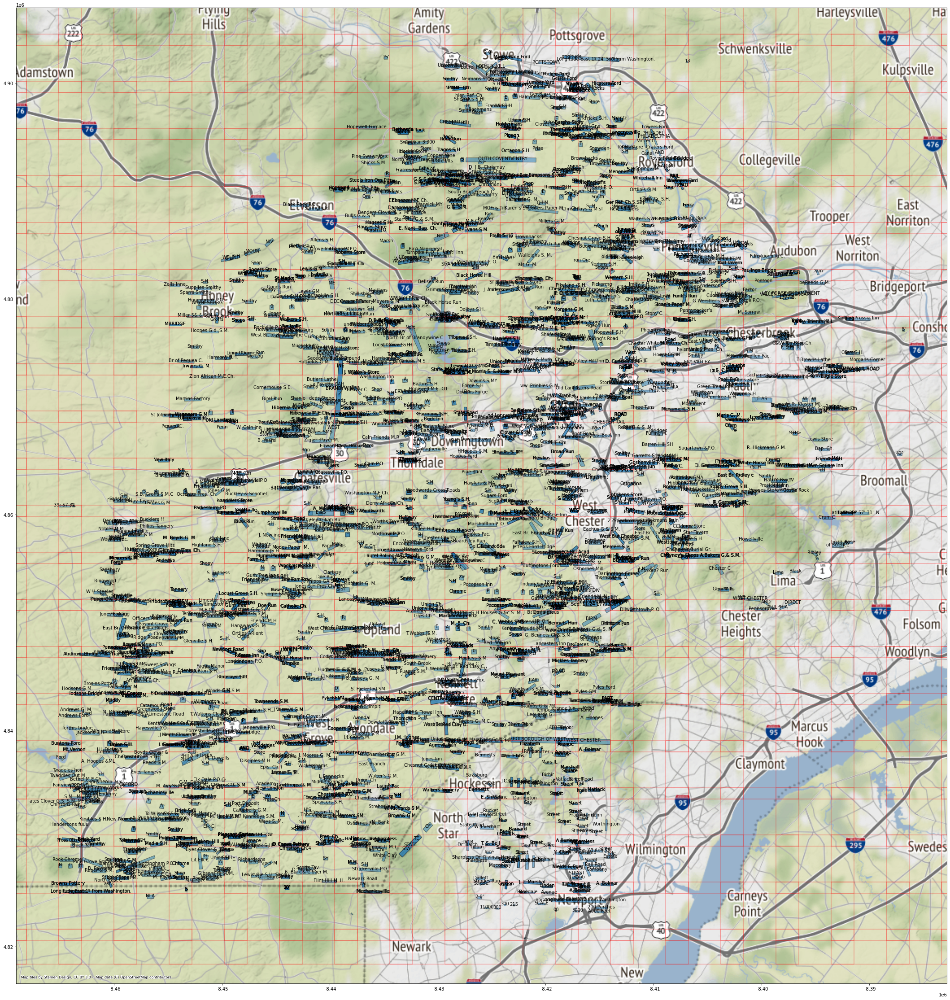

In [11]:
line_text_df=gpd.read_file(os.path.join(map_base_dir,"all_line_text.shp"))

print(line_text_df.crs)
# Change crs to one compatible with basemap
line_text_df = line_text_df.to_crs(epsg=32129) #3857 #32129 (fix this)
print(line_text_df.crs)

ax = line_text_df.plot(figsize=(40, 40), alpha=0.5, edgecolor='k')
ctx.add_basemap(ax)

tile_polys_df=gpd.read_file(os.path.join(map_base_dir,"tif_tiles/tile_polys.shp"))

#tile_polys_df = tile_polys_df.to_crs(epsg=3857) #3857
tile_polys_df.boundary.plot(ax=ax,color="red",alpha=0.3)

line_text_df['coords'] = line_text_df['geometry'].apply(lambda x: x.representative_point().coords[:])
line_text_df['coords'] = [coords[0] for coords in line_text_df['coords']]
for idx, row in line_text_df.iterrows():
    plt.annotate(s=row['text'], xy=row['coords'], horizontalalignment='center')

In [12]:
glist = line_text_df['geometry']
tlist = line_text_df['text']
rows_to_remove = []
print(len(glist))
for i in range(len(glist)):
    for j in range(i + 1, len(glist)):
        intersect_poly = glist[i].intersection(glist[j])

        if(not intersect_poly.is_empty):
            if(glist[i].area < glist[j].area):
                # glist[i] is smaller
                if(intersect_poly.area/glist[i].area >.8):
                    print("remove i : ", i, j, "{:3.2%}".format(intersect_poly.area/glist[i].area), int(intersect_poly.area), " Remove: ", tlist[i], int(glist[i].area), " Keep: ", tlist[j], int(glist[j].area))
                    rows_to_remove.append(i)
            else:
                if(glist[i].area >= glist[j].area):  
                    if(intersect_poly.area/glist[j].area >.8):
                        print("remove j : ", i, j, "{:3.2%}".format(intersect_poly.area/glist[j].area), int(intersect_poly.area), " Keep: ", tlist[i], int(glist[i].area),  " Remove: ", tlist[j], int(glist[j].area))
                        rows_to_remove.append(j)
                    #else:             
                    #    print("keep both: ", i, j, "{:3.2%}".format(intersect_poly.area/glist[i].area), "{:3.2%}".format(intersect_poly.area/glist[j].area), int(intersect_poly.area), tlist[i], int(glist[i].area), tlist[j], int(glist[j].area))


3516
remove j :  1 8 99.82% 265354  Keep:  Unionville 35 422265  Remove:  Unionville 265842
remove j :  2 12 100.00% 175915  Keep:  Smithy 199587  Remove:  Smithy 175923
remove j :  3 17 97.29% 251179  Keep:  MENME. Ch. 279482  Remove:  ENME. Ch. 258186
remove j :  3 52 95.58% 223996  Keep:  MENME. Ch. 279482  Remove:  MME. Ch. 234348
remove j :  3 61 95.44% 220618  Keep:  MENME. Ch. 279482  Remove:  MME. Ch. 231156
remove i :  5 20 98.77% 361174  Remove:  Manatawny Ford 365660  Keep:  Manatawny Ford 373615
remove j :  7 21 94.36% 58518  Keep:  RIVER 118495  Remove:  VER 62015
remove i :  10 24 98.25% 462444  Remove:  Pottstowny Landing 470690  Keep:  Pottstowny Landing 591729
remove j :  11 26 99.26% 100067  Keep:  Prices G.M. 346958  Remove:  G.M. 100816
remove j :  14 28 99.98% 62001  Keep:  Clover. M. 211157  Remove:  M. 62015
remove j :  15 30 95.60% 101362  Keep:  S.H. 109344  Remove:  S.H. 106027
remove i :  15 59 96.88% 105933  Remove:  S.H. 109344  Keep:  S.H. 109967
remove i 

In [17]:
print(rows_to_remove)
# remove the rows
line_text_df_deduplicated = line_text_df
line_text_df_deduplicated = line_text_df_deduplicated.drop(rows_to_remove)
print(len(line_text_df_deduplicated['geometry']))
print(line_text_df_deduplicated['coords'],type(line_text_df_deduplicated['coords']))
print(line_text_df_deduplicated)
print(line_text_df_deduplicated.columns)

print(type(line_text_df_deduplicated))
#we have to drop this since .shp files don't support tuples
line_text_df_deduplicated = line_text_df_deduplicated.drop(columns='coords')
line_text_df_deduplicated.to_file(os.path.join(map_base_dir,"all_line_text_deduplicated.shp"))

print(line_text_df_deduplicated.columns)

[8, 12, 17, 52, 61, 5, 21, 10, 26, 28, 30, 15, 15, 31, 60, 16, 52, 61, 18, 19, 38, 27, 29, 30, 30, 31, 31, 32, 80, 109, 81, 43, 82, 34, 35, 35, 35, 36, 36, 36, 46, 40, 48, 108, 135, 80, 109, 43, 43, 83, 111, 84, 45, 48, 135, 55, 50, 50, 51, 144, 158, 61, 53, 55, 55, 144, 158, 57, 77, 58, 58, 59, 60, 88, 91, 72, 74, 75, 183, 205, 105, 184, 209, 77, 77, 80, 82, 84, 86, 114, 116, 93, 123, 126, 101, 226, 102, 207, 102, 183, 205, 132, 208, 232, 105, 209, 106, 106, 135, 136, 122, 138, 126, 226, 207, 227, 228, 141, 130, 256, 142, 131, 131, 132, 232, 133, 134, 140, 141, 141, 142, 142, 157, 144, 145, 146, 149, 150, 155, 181, 307, 185, 186, 188, 171, 193, 175, 302, 324, 176, 204, 178, 179, 179, 179, 203, 329, 181, 307, 308, 183, 209, 214, 302, 324, 219, 303, 198, 199, 221, 327, 354, 201, 328, 201, 203, 203, 204, 204, 226, 207, 232, 211, 216, 217, 218, 251, 351, 221, 354, 328, 353, 352, 355, 224, 356, 256, 257, 236, 265, 246, 268, 351, 355, 252, 253, 377, 273, 274, 275, 394, 413, 395, 271, 271, 2

epsg:32637
epsg:32637


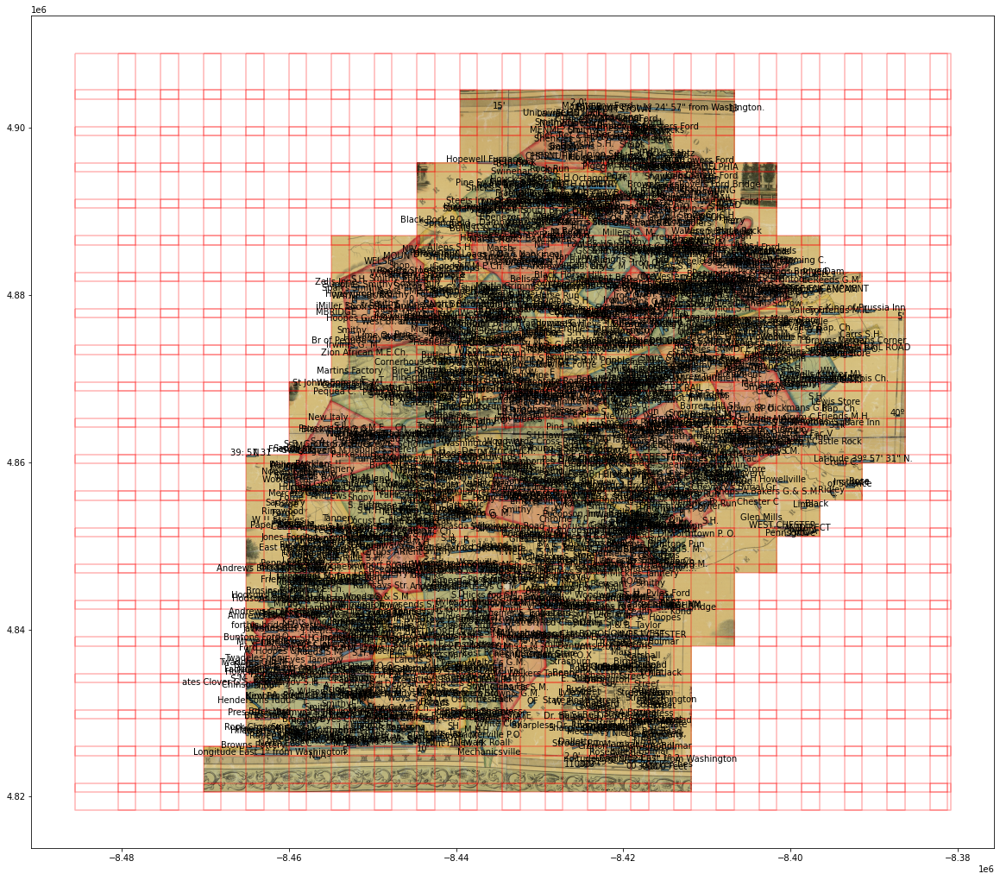

In [20]:
import rasterio
import rasterio.plot
line_text_df=gpd.read_file(os.path.join(map_base_dir,"all_line_text_deduplicated.shp"))
print(line_text_df.crs)
# Change crs to one compatible with basemap
#line_text_df = line_text_df.to_crs(epsg=3857) #3857
#line_text_df = line_text_df.to_crs(epsg=32127) #3857

print(line_text_df.crs)

ax = line_text_df.plot(figsize=(20, 20), alpha=0.5, edgecolor='k')

for tf in tiles:
    tif_file = rasterio.open(tf)
    rasterio.plot.show(tif_file, ax=ax)
#ctx.add_basemap(ax)

tile_polys_df=gpd.read_file(os.path.join(map_base_dir,"tif_tiles/tile_polys.shp"))
#tile_polys_df = tile_polys_df.to_crs(epsg=3857) #3857
#tile_polys_df = tile_polys_df.to_crs(epsg=32637) #3857
tile_polys_df.boundary.plot(ax=ax,color="red",alpha=0.3)

line_text_df['coords'] = line_text_df['geometry'].apply(lambda x: x.representative_point().coords[:])
line_text_df['coords'] = [coords[0] for coords in line_text_df['coords']]
for idx, row in line_text_df.iterrows():
    plt.annotate(s=row['text'], xy=row['coords'],                 horizontalalignment='center')

epsg:32637


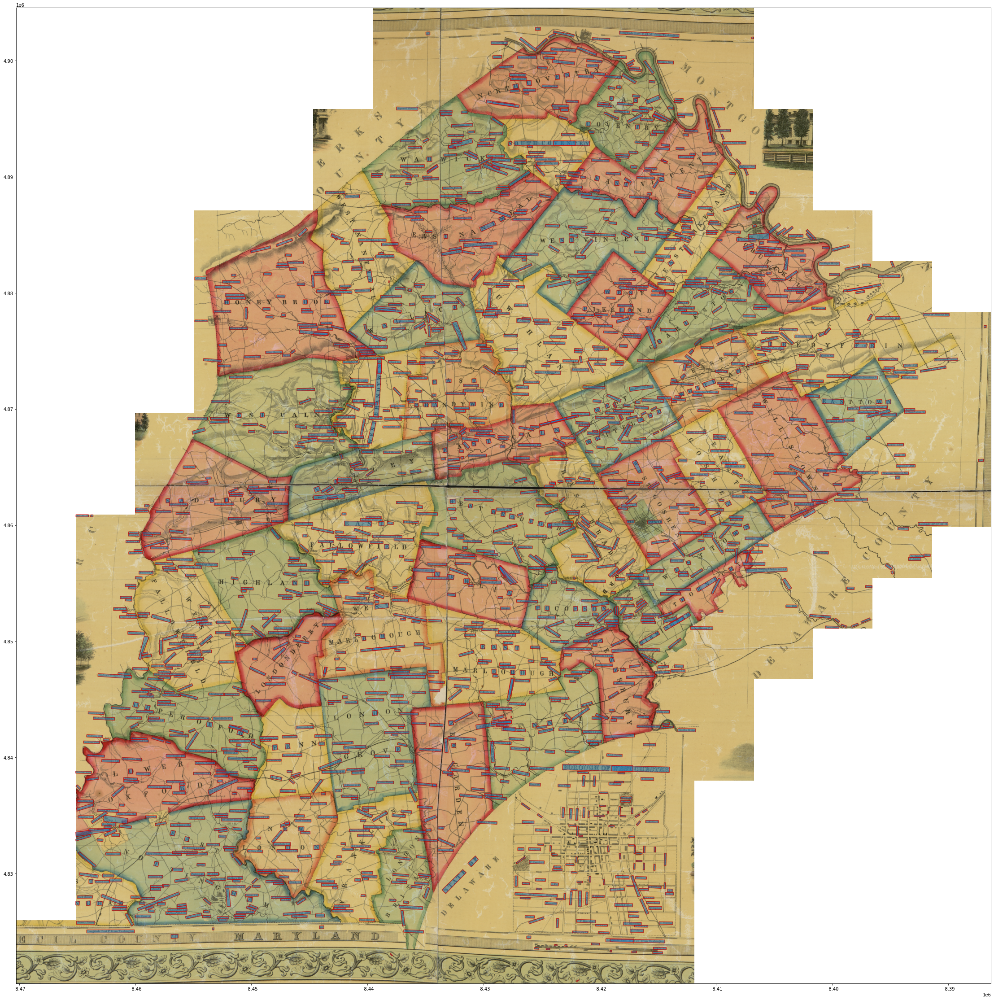

In [21]:
line_text_df=gpd.read_file(os.path.join(map_base_dir,"all_line_text_deduplicated.shp"))
print(line_text_df.crs)
# Change crs to one compatible with basemap
#line_text_df = line_text_df.to_crs(epsg=3857) #3857
#line_text_df = line_text_df.to_crs(epsg=4326) #3857
ax = line_text_df.plot(figsize=(40, 40), alpha=0.5, edgecolor='k')
for tf in tiles:
    tif_file = rasterio.open(tf)
    rasterio.plot.show(tif_file, ax=ax)

line_text_df.boundary.plot(ax=ax,color="red",alpha=0.5)


In [23]:
#Remove all of the labels that have only numbers
import rasterio
import rasterio.plot

line_text_dedup_df=gpd.read_file(os.path.join(map_base_dir,"all_line_text_deduplicated.shp"))
print(line_text_dedup_df.crs)

glist_dedup = line_text_dedup_df['geometry']
tlist_dedup = line_text_dedup_df['text']
rows_dedup_to_remove = []
print(len(glist_dedup))
for i in range(len(glist_dedup)):
    print(" i : ", i, tlist_dedup[i])
    if(tlist_dedup[i].isnumeric()):
        rows_dedup_to_remove.append(i)
        print("remove i : ", i, tlist_dedup[i])
    if(len(tlist_dedup[i])==1):
        rows_dedup_to_remove.append(i)
        print("remove i : ", i, tlist_dedup[i])

print(rows_dedup_to_remove)
# remove the rows
line_text_df_no_nums = line_text_dedup_df
line_text_df_no_nums = line_text_dedup_df.drop(rows_dedup_to_remove)
print(len(line_text_df_no_nums['geometry']))

#print(line_text_df_no_nums['coords'],type(line_text_df_no_nums['coords']))
print(line_text_df_no_nums)
print(line_text_df_no_nums.columns)

print(type(line_text_df_no_nums))

line_text_df_no_nums.to_file(os.path.join(map_base_dir,"all_line_text_no_nums.shp"))

print(line_text_df_deduplicated.columns)


line_text_dedup_df=gpd.read_file(os.path.join(map_base_dir,"all_line_text_no_nums.shp"))
print(line_text_dedup_df.crs)

glist_dedup = line_text_dedup_df['geometry']
tlist_dedup = line_text_dedup_df['text']
print(len(glist_dedup))
for i in range(len(glist_dedup)):
    print(i, tlist_dedup[i])

epsg:32637
1990
 i :  0 15'
 i :  1 Unionville 35
 i :  2 Smithy
 i :  3 MENME. Ch.
 i :  4 2 0'
 i :  5 Laurel Hill Locks
 i :  6 RIVER
 i :  7 SCHUYLKILL
 i :  8 Prices G.M.
 i :  9 Neimans Store
 i :  10 Clover. M.
 i :  11 Manatawny Ford
 i :  12 POTTSTOWN
 i :  13 Girard Canal
 i :  14 Pottstowny Landing
 i :  15 Parkers Ford
 i :  16 Jones Rimi
 i :  17 Longitude East 1º 24' 57" from Washington.
 i :  18 Geists Ford
 i :  19 Hiesters Ford
 i :  20 Stagers
 i :  21 Bombay
 i :  22 13
remove i :  22 13
 i :  23 Hopewell Furnace
 i :  24 CHESNUT HI
 i :  25 Bap Ch.
 i :  26 Smithy
 i :  27 hier. Ref. Ch.
 i :  28 N
remove i :  28 N
 i :  29 Shenkles S.HI.
 i :  30 H
remove i :  30 H
 i :  31 C
remove i :  31 C
 i :  32 Franklin S.H.
 i :  33 Smithy
 i :  34 Bachmans
 i :  35 Store
 i :  36 ESNUT HILL
 i :  37 Pigeon
 i :  38 S.H ., Stumptown
 i :  39 Lumber Yard
 i :  40 Ger Bap Chy
 i :  41 E
remove i :  41 E
 i :  42 Halcyon S/H.
 i :  43 Mononist M.M.
 i :  44 Shops
 i :  45 E
re

In [13]:
line_text_dedup_df=gpd.read_file(os.path.join(map_base_dir,"all_line_text_no_nums.shp"))
print(line_text_dedup_df.crs)

glist_dedup = line_text_dedup_df['geometry']
tlist_dedup = line_text_dedup_df['text']
print(len(glist_dedup))
for i in range(len(glist_dedup)):
    print(i, tlist_dedup[i])

epsg:32637
1846
0 15'
1 Unionville 35
2 Smithy
3 MENME. Ch.
4 2 0'
5 Laurel Hill Locks
6 RIVER
7 SCHUYLKILL
8 Prices G.M.
9 Neimans Store
10 Clover. M.
11 Manatawny Ford
12 POTTSTOWN
13 Girard Canal
14 Pottstowny Landing
15 Parkers Ford
16 Jones Rimi
17 Longitude East 1º 24' 57" from Washington.
18 Geists Ford
19 Hiesters Ford
20 Stagers
21 Bombay
22 Hopewell Furnace
23 CHESNUT HI
24 Bap Ch.
25 Smithy
26 hier. Ref. Ch.
27 Shenkles S.HI.
28 Franklin S.H.
29 Smithy
30 Bachmans
31 Store
32 ESNUT HILL
33 Pigeon
34 S.H ., Stumptown
35 Lumber Yard
36 Ger Bap Chy
37 Halcyon S/H.
38 Mononist M.M.
39 Shops
40 Union S.H.
41 Kulps
42 Barghs Story
43 Holderinans
44 Clover & A.M.
45 36.M
46 Smithyy
47 Hrsbergers
48 Fricks Kocks
49 Ford
50 Hook Rock
51 Lumber Yard
52 Store
53 S.M.
54 Smithy
55 Shantz
56 kFricks S.H.
57 Burial Gr.s
58 Store
59 Hoffmans G.M.
60 Lawrenceville
61 Custers
62 Ford
63 Lowers Ford
64 Bethesda
65 Pine Swawryp
66 Pine
67 Shicks S.M.
68 North
69 Fratres To
70 Mine /Run
71 Rock

In [14]:
#Retain African
import rasterio
import rasterio.plot
import geopandas as gpd
import os

line_text_no_nums_df=gpd.read_file(os.path.join(map_base_dir,"all_line_text_no_nums.shp"))
print(line_text_no_nums_df.crs)

glist_no_nums = line_text_no_nums_df['geometry']
tlist_no_nums = line_text_no_nums_df['text']
rows_no_nums_to_remove = []
print(len(glist_no_nums))

#if "blah" not in somestring: 
search_text  = []
search_text.append("african")
search_text.append("afr")
search_text.append("afn")


for i in range(len(glist_no_nums)):
    #print(" i : ", i, tlist_no_nums[i])
    #x in str for x in myList
    remove = True
    for st in search_text:
        if(st in tlist_no_nums[i].lower()):
            remove = False
        
    if (remove == True):
        rows_no_nums_to_remove.append(i)
        #print("remove i : ", i, tlist_no_nums[i].lower())
    else:
        print("keep i : ", i, tlist_no_nums[i])

print(rows_no_nums_to_remove)
# remove the rows
line_text_df_search = line_text_no_nums_df
line_text_df_search = line_text_no_nums_df.drop(rows_no_nums_to_remove)
print(len(line_text_df_search['geometry']))

#print(line_text_df_no_nums['coords'],type(line_text_df_no_nums['coords']))
print(line_text_df_search)
print(line_text_df_search.columns)

print(type(line_text_df_search))
line_text_df_search.to_file(os.path.join(map_base_dir,"all_line_text_search.shp"))
print(line_text_df_search.columns)

epsg:32637
1846
keep i :  593 Zion African M.E.Ch.
keep i :  860 Derry African/Ch.
keep i :  960 Milion African
keep i :  1051 African
keep i :  1285 African
keep i :  1334 African M.E.Ch.
keep i :  1476 African Union Ch
keep i :  1529 Institute African
keep i :  1651 African M.E.Ch.
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164,

In [17]:
import geopandas
line_text_df_search_file = os.path.join(map_base_dir,"all_line_text_search.shp")
shp_file = geopandas.read_file(line_text_df_search_file)
shp_file.to_file(os.path.join(map_base_dir,"all_line_text_search.geojson"), driver='GeoJSON')

Download /content/line_text.shp to use it in other maps such as ArcGIS Map. 